# False Negative Analysis

1. Missed nodule analysis for each model at 0.125, 2 & 8: Note consistent features:
    - Common nodules missed
    - Sub-type
    - Size
    - Lung wall proximity
    - Lobe

In [1]:
from metaflow import Flow
import pandas as pd

latest_run = Flow('MissedNodulesFlow').latest_successful_run

missed_nodule_counts = {}
for model in latest_run.data.results.keys():

    model_missed_metadata = latest_run.data.results[model]
    for operating_point in [256]:

        missed_metadata = model_missed_metadata[operating_point]

        for idx, row in missed_metadata[missed_metadata.miss].iterrows():
            uid = f"{row['name']}_{row['nodule_lesion_id']}"

            if uid not in missed_nodule_counts:
                missed_nodule_counts[uid] = []

            missed_nodule_counts[uid].append(model)

missed_nodule_counts = {k: '|'.join(v) for k, v in missed_nodule_counts.items()}

df = (
    pd.DataFrame(missed_nodule_counts.items(), columns=['uid', 'models'])
    .assign(grt123=lambda x: x.models.str.contains('grt123'))
    .assign(detection=lambda x: x.models.str.contains('detection'))
    .assign(ticnet=lambda x: x.models.str.contains('ticnet'))
    .filter(['uid', 'grt123', 'detection', 'ticnet'])
)

all = df[df.grt123 & df.detection & df.ticnet]
print('all:', all.shape)

grt123 = df[df.grt123]
print('grt123:', grt123.shape)

detection = df[df.detection]
print('detection:', detection.shape)

ticnet = df[df.ticnet]
print('ticnet:', ticnet.shape)


MetaflowNotFound: Flow('MissedNodulesFlow') does not exist

# Profile the missed nodules

/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/ipykernel_29082/3999640980.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data, x='nodule_type', palette='viridis', ax=ax[0,0])
/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/ipykernel_29082/3999640980.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data, x='nodule_brock_score_cats', palette='viridis', order=sorted(data['nodule_brock_score_cats'].dropna().unique()), ax=ax[0,1])
/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/ipykernel_29082/3999640980.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=Fals

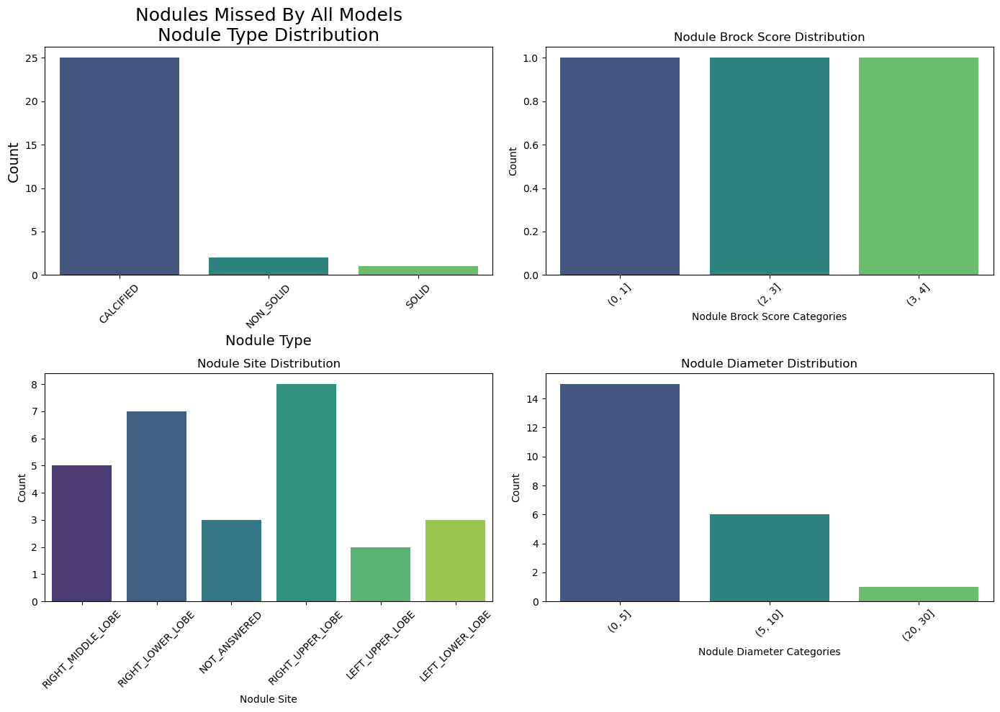

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')

def profile_data(data):
    test_data = (
        pd.read_csv('/Users/john/Projects/SOTAEvaluationNoduleDetection/metadata/summit/optimisation/test_metadata.csv')
        .assign(uid=lambda x: x.scan_id + '_' + x.nodule_lesion_id.astype(str))
        .assign(nodule_diameter_cats=lambda x: pd.cut(x.nodule_diameter_mm, bins=[0, 5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]))
        .assign(nodule_brock_score_cats=lambda x: pd.cut(x.nodule_brock_score, bins=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]))
        )

    test_data.head()

    # 1. all
    data = data.merge(test_data, on='uid')

    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))

    sns.countplot(data=data, x='nodule_type', palette='viridis', ax=ax[0,0])
    ax[0,0].set_title('Nodules Missed By All Models\nNodule Type Distribution', fontsize=18)
    ax[0,0].set_xlabel('Nodule Type', fontsize=14)
    ax[0,0].set_ylabel('Count', fontsize=14)
    ax[0,0].tick_params(axis='x', rotation=45)
    
    sns.countplot(data=data, x='nodule_brock_score_cats', palette='viridis', order=sorted(data['nodule_brock_score_cats'].dropna().unique()), ax=ax[0,1])
    ax[0,1].set_title('Nodule Brock Score Distribution')
    ax[0,1].set_xlabel('Nodule Brock Score Categories')
    ax[0,1].set_ylabel('Count')
    ax[0,1].tick_params(axis='x', rotation=45)

    sns.countplot(data=data, x='nodule_site', palette='viridis', ax=ax[1,0])
    ax[1,0].set_title('Nodule Site Distribution')
    ax[1,0].set_xlabel('Nodule Site')
    ax[1,0].set_ylabel('Count')
    ax[1,0].tick_params(axis='x', rotation=45)
    
    sns.countplot(data=data, x='nodule_diameter_cats', palette='viridis', order=sorted(data['nodule_diameter_cats'].dropna().unique()), ax=ax[1,1])
    ax[1,1].set_title('Nodule Diameter Distribution')
    ax[1,1].set_xlabel('Nodule Diameter Categories')
    ax[1,1].set_ylabel('Count')
    ax[1,1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()

profile_data(all)

profile_data(grt123)

profile_data(detection)

profile_data(ticnet)


In [ ]:
# Pull down and visualise the different groups of missed nodules
import os
import subprocess
import sys

from matplotlib import pyplot as plt
import numpy as np

workspace_path = '/Users/john/Projects/SOTAEvaluationNoduleDetection'

if os.path.basename(os.getcwd()).upper() == 'SOTAEVALUATIONNODULEDETECTION':
    sys.path.append('utilities')
    sys.path.append('notebooks')
else:
    sys.path.append('../../utilities')
    sys.path.append('../../notebooks')

from summit_utils import SummitScan, xyz2irc, XyzTuple

def get_voxel_coords(scan_id, xyz):
    scan_path = copy_scan_from_cluster(scan_id)
    scan = SummitScan.load_scan(scan_path)

    return xyz2irc(
        xyz,
        scan.origin,
        scan.voxel_size,
        scan.orientation
    )

def copy_scan_from_cluster(scan_id):
    study_id = scan_id.split('_')[0]
   # now copy the src file
    if not os.path.exists(f"{workspace_path}/data/summit/scans/{study_id}/{scan_id}.mhd"):
        os.makedirs(f"{workspace_path}/data/summit/scans/{study_id}", exist_ok=True)

        command = [
            "scp",
            "-P 2222",
            f"jmccabe@localhost:/cluster/project2/SummitLung50/{study_id}/{scan_id}.*",
            f"{workspace_path}/data/summit/scans/{study_id}/."
        ]
        result = subprocess.run(command)
        print(result.stdout)
    else:
        print(f'{scan_id} already exists')

    return f"{workspace_path}/data/summit/scans/{study_id}/{scan_id}.mhd"

def display_nodules(scan_id, data):
    scan_path = copy_scan_from_cluster(scan_id)
    print(scan_path)
    scan = SummitScan.load_scan(scan_path)

    # Get the number of nodules
    nodule_cnt = data.shape[0]

    # Create a new figure based on the number of nodules
    fig, axs = plt.subplots(nodule_cnt, 1, figsize=( 7, nodule_cnt * 7))
    fig.suptitle(f"{scan_id} ({nodule_cnt} nodules)")
    
    if not isinstance(axs, (list, np.ndarray)):
        axs = [axs]  # Convert single Axes to a list for consistency

    for i, (idx, row) in enumerate(data.iterrows()):

        img = scan.image[row['idx'], :, :]
        axs[i].imshow(img, cmap='gray')

        if row["nodule_type"] == 'CALCIFIED':
            diameter = 15
        else:
            diameter = row['nodule_diameter_mm']

        # Add a rectangle centered on irc
        rect = plt.Rectangle(
            (
                row['col'] - diameter,
                row['row'] - diameter
            ),
            diameter * 2,
            diameter * 2,
            linewidth=1,
            edgecolor='r',
            facecolor='none'
        )

        axs[i].add_patch(rect)
        axs[i].set_title(f"{row['nodule_type']} ({row['nodule_diameter_mm']}mm)")

    plt.show()

test_data = (
    pd.read_csv('/Users/john/Projects/SOTAEvaluationNoduleDetection/metadata/summit/optimisation/test_metadata.csv')
    .assign(uid=lambda x: x.scan_id + '_' + x.nodule_lesion_id.astype(str))
    )

test_data.head()

# 1. all
all_data = all.merge(test_data, on='uid')

voxel_coords = {}
for idx, row in all_data.iterrows():

    voxel_coords[idx] = get_voxel_coords(
        row['scan_id'],
        XyzTuple(
            row['nodule_x_coordinate'],
            row['nodule_y_coordinate'],
            row['nodule_z_coordinate']
        )
    )

voxel_coords

summit-2868-ucx_Y0_BASELINE_A already exists
summit-2336-xcb_Y0_BASELINE_A already exists
summit-3743-tru_Y0_BASELINE_A already exists
summit-3743-tru_Y0_BASELINE_A already exists
summit-3743-tru_Y0_BASELINE_A already exists
summit-3743-tru_Y0_BASELINE_A already exists
summit-3743-tru_Y0_BASELINE_A already exists
summit-3743-tru_Y0_BASELINE_A already exists
summit-4853-ktf_Y0_BASELINE_A already exists
summit-4644-jve_Y0_BASELINE_A already exists
summit-5353-meq_Y0_BASELINE_A already exists
summit-5353-meq_Y0_BASELINE_A already exists
summit-5434-hxk_Y0_BASELINE_A already exists
summit-5434-hxk_Y0_BASELINE_A already exists
summit-7335-rsa_Y0_BASELINE_A already exists
summit-7335-rsa_Y0_BASELINE_A already exists
summit-9284-fgt_Y0_BASELINE_A already exists
summit-7935-trn_Y0_BASELINE_A already exists
summit-6224-uqh_Y0_BASELINE_A already exists
summit-3846-deh_Y0_BASELINE_A already exists
summit-3846-deh_Y0_BASELINE_A already exists
summit-6968-wuv_Y0_BASELINE_A already exists
summit-697

{0: IrcTuple(index=141, row=106, col=176),
 1: IrcTuple(index=146, row=330, col=144),
 2: IrcTuple(index=156, row=179, col=45),
 3: IrcTuple(index=362, row=207, col=99),
 4: IrcTuple(index=423, row=285, col=322),
 5: IrcTuple(index=71, row=160, col=115),
 6: IrcTuple(index=324, row=278, col=58),
 7: IrcTuple(index=375, row=265, col=109),
 8: IrcTuple(index=370, row=229, col=130),
 9: IrcTuple(index=38, row=237, col=161),
 10: IrcTuple(index=183, row=247, col=122),
 11: IrcTuple(index=180, row=257, col=88),
 12: IrcTuple(index=283, row=348, col=117),
 13: IrcTuple(index=257, row=322, col=144),
 14: IrcTuple(index=161, row=341, col=170),
 15: IrcTuple(index=201, row=138, col=72),
 16: IrcTuple(index=222, row=343, col=107),
 17: IrcTuple(index=352, row=373, col=336),
 18: IrcTuple(index=203, row=148, col=121),
 19: IrcTuple(index=117, row=222, col=63),
 20: IrcTuple(index=278, row=157, col=333),
 21: IrcTuple(index=273, row=169, col=94),
 22: IrcTuple(index=348, row=288, col=142),
 23: Ir

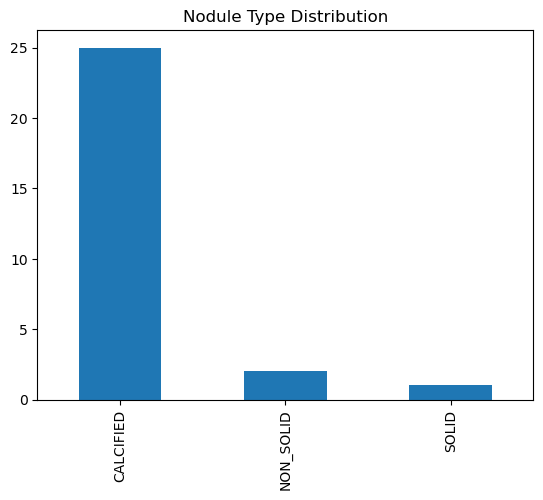

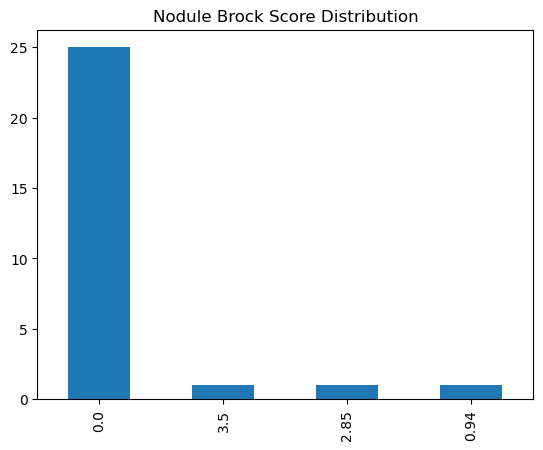

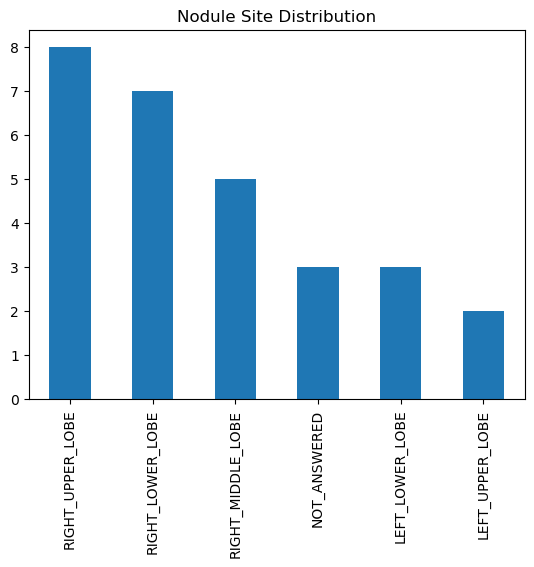

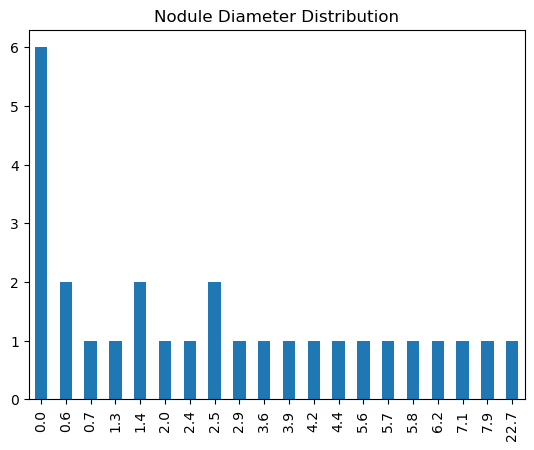

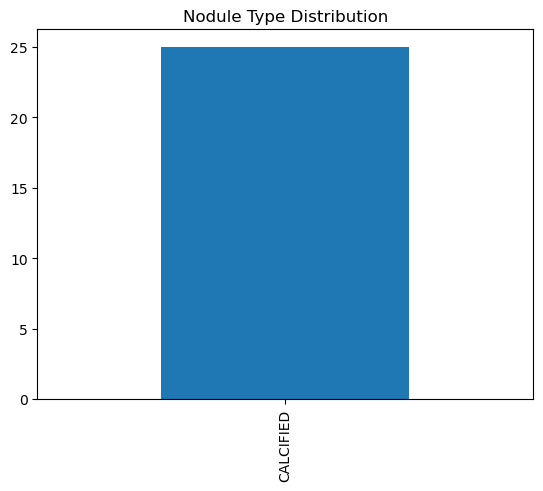

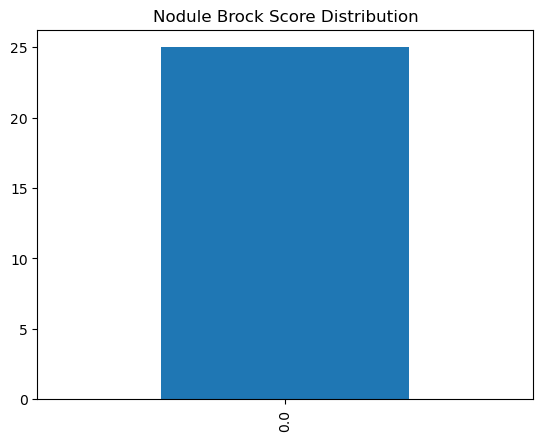

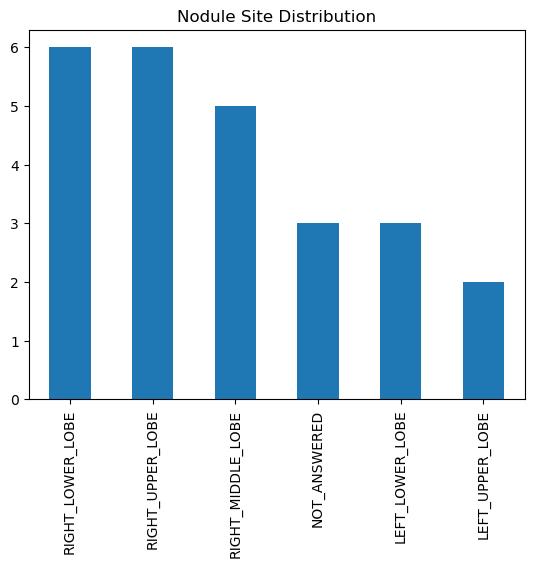

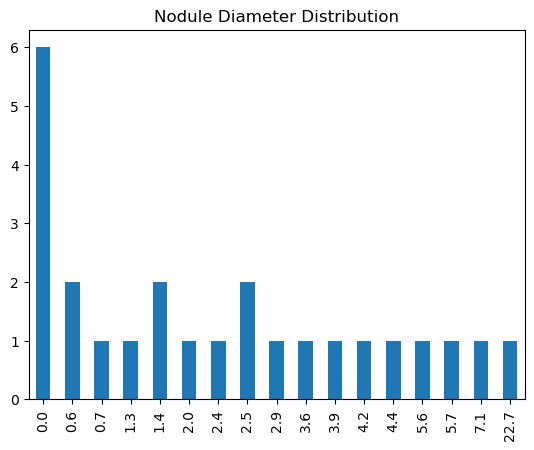

In [44]:
voxel_coords_df = pd.DataFrame(voxel_coords).T
voxel_coords_df.columns = ['idx', 'row', 'col']
all_data = all_data.join(voxel_coords_df)
all_data.head()

,uid,grt123,detection,ticnet,form_instance_id,form_instance_status,participant_id,form_instance_index,nodule_brock_score,nodule_category,...,radiology_report_malignancy_primary_order,radiology_report_scans_transfer_state,gender,age_group,ethnic_group,radiology_report_lesions_to_exclude,scan_id,idx,row,col
0,summit-2868-ucx_Y0_BASELINE_A_3.0,True,True,True,RZZsS_nBN09P4l2WLY54xGgthaJKSFCyixFpqk4M8Xw,COMPLETED,summit-2868-ucx,2.0,0.0,BASELINE,...,NaN,LUNG50=VEOLITY,MALE,55-59,White,False,summit-2868-ucx_Y0_BASELINE_A,141,106,176
1,summit-2336-xcb_Y0_BASELINE_A_2.0,True,True,True,SKSIF19hTstoJXyWBYaZEtfb4cPW3I2tUwZzKzNbHPk,COMPLETED,summit-2336-xcb,1.0,0.0,BASELINE,...,NaN,!LUNG50_!VEOLITY,MALE,60-64,White,False,summit-2336-xcb_Y0_BASELINE_A,146,330,144
2,summit-3743-tru_Y0_BASELINE_A_4.0,True,True,True,SBZ3mQCwG3pQ6T5SBWb1yhrY6kvDeO-WX3MPcG0vM6U,COMPLETED,summit-3743-tru,3.0,0.0,BASELINE,...,NaN,LUNG50=VEOLITY,FEMALE,65-69,White,False,summit-3743-tru_Y0_BASELINE_A,156,179,45
3,summit-3743-tru_Y0_BASELINE_A_9.0,True,True,True,SBZ3mQCwG3pQ6T5SBWb1yhrY6kvDeO-WX3MPcG0vM6U,COMPLETED,summit-3743-tru,8.0,0.0,BASELINE,...,NaN,LUNG50=VEOLITY,FEMALE,65-69,White,False,summit-3743-tru_Y0_BASELINE_A,362,207,99
4,summit-3743-tru_Y0_BASELINE_A_12.0,True,True,True,SBZ3mQCwG3pQ6T5SBWb1yhrY6kvDeO-WX3MPcG0vM6U,COMPLETED,summit-3743-tru,11.0,0.0,BASELINE,...,NaN,LUNG50=VEOLITY,FEMALE,65-69,White,False,summit-3743-tru_Y0_BASELINE_A,423,285,322


summit-2336-xcb_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-2336-xcb/summit-2336-xcb_Y0_BASELINE_A.mhd


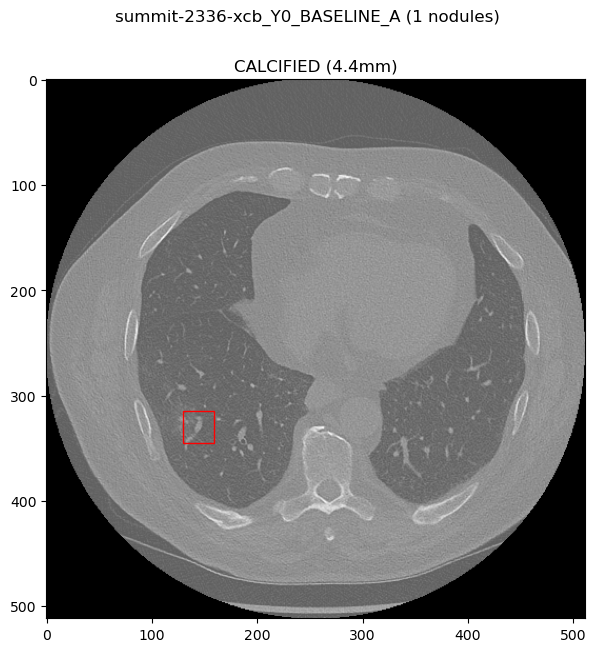

summit-2868-ucx_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-2868-ucx/summit-2868-ucx_Y0_BASELINE_A.mhd


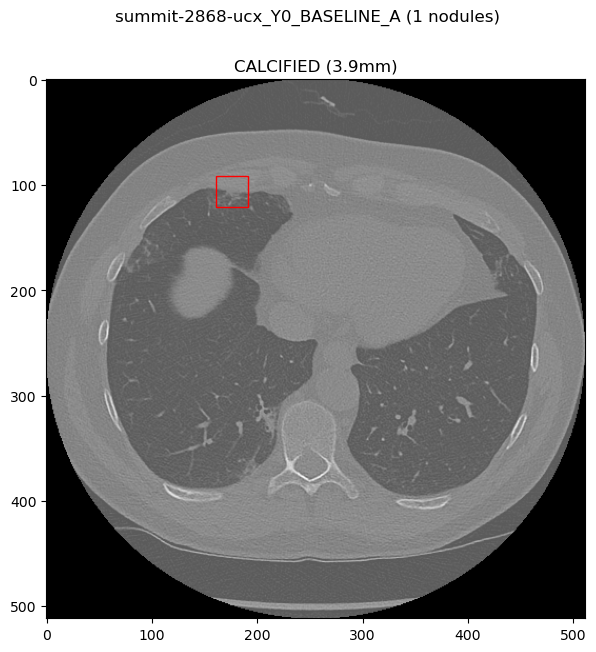

summit-3743-tru_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-3743-tru/summit-3743-tru_Y0_BASELINE_A.mhd


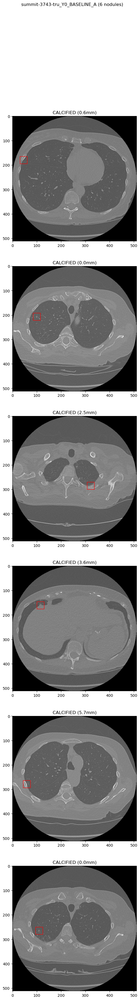

summit-3846-deh_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-3846-deh/summit-3846-deh_Y0_BASELINE_A.mhd


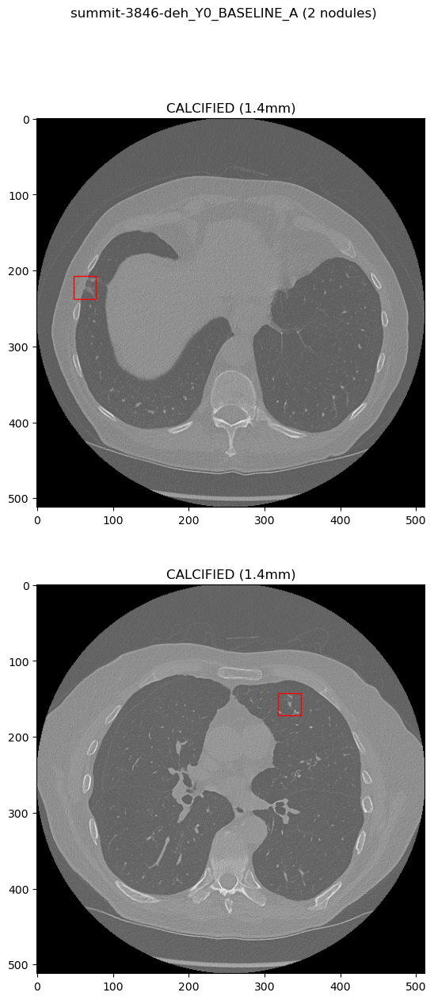

summit-4644-jve_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-4644-jve/summit-4644-jve_Y0_BASELINE_A.mhd


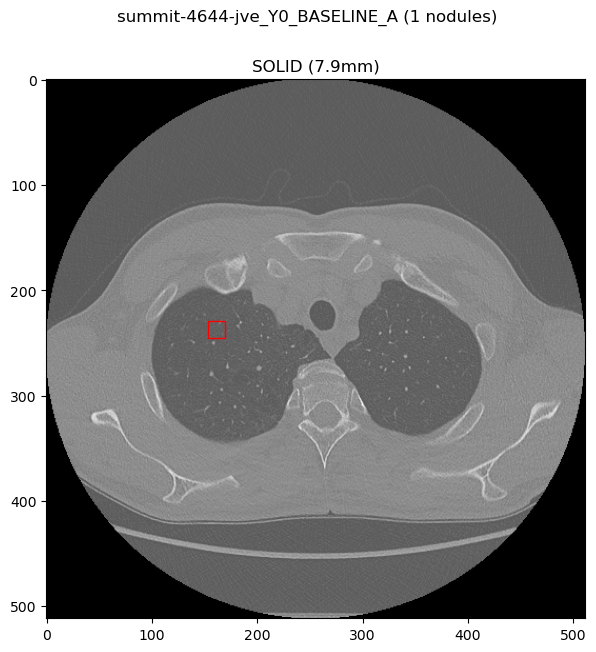

summit-4672-rjd_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-4672-rjd/summit-4672-rjd_Y0_BASELINE_A.mhd


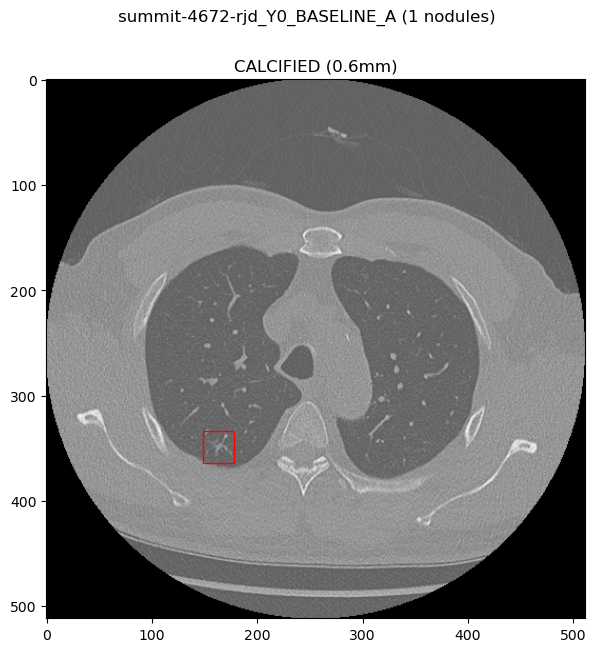

summit-4853-ktf_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-4853-ktf/summit-4853-ktf_Y0_BASELINE_A.mhd


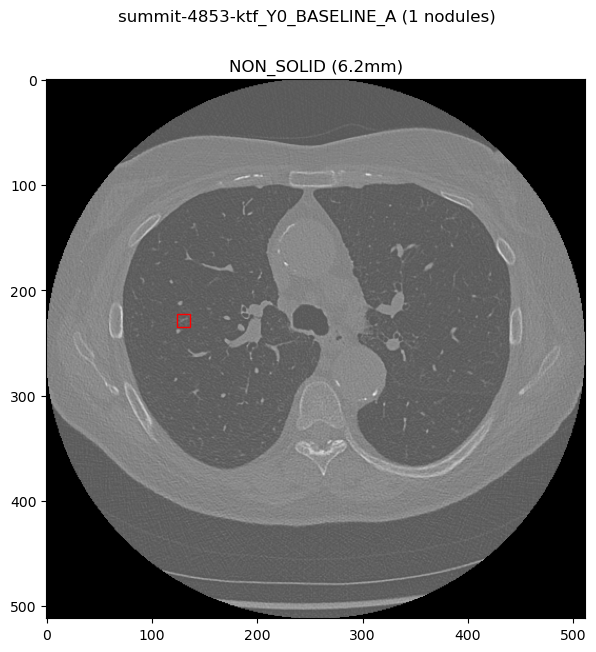

summit-5353-meq_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-5353-meq/summit-5353-meq_Y0_BASELINE_A.mhd


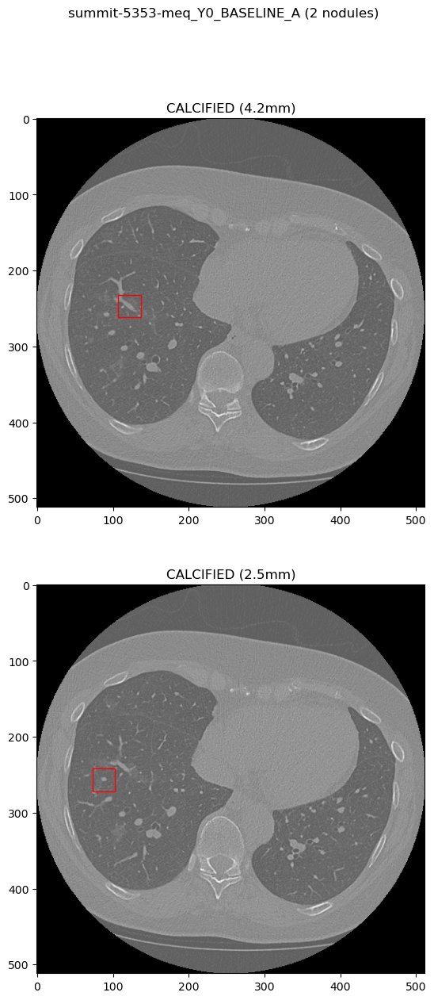

summit-5434-hxk_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-5434-hxk/summit-5434-hxk_Y0_BASELINE_A.mhd


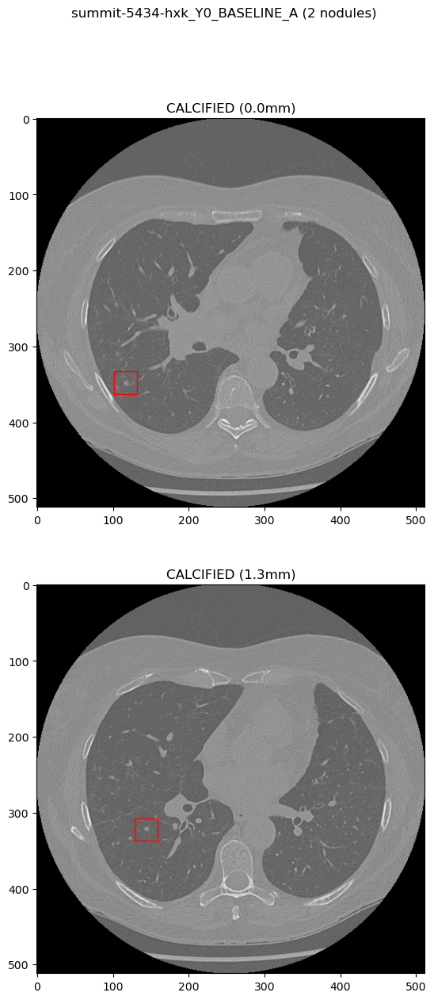

summit-6224-uqh_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-6224-uqh/summit-6224-uqh_Y0_BASELINE_A.mhd


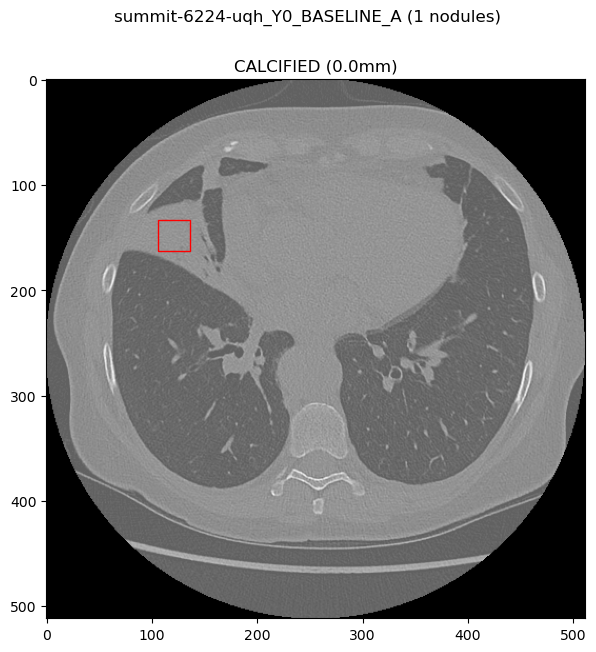

summit-6968-wuv_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-6968-wuv/summit-6968-wuv_Y0_BASELINE_A.mhd


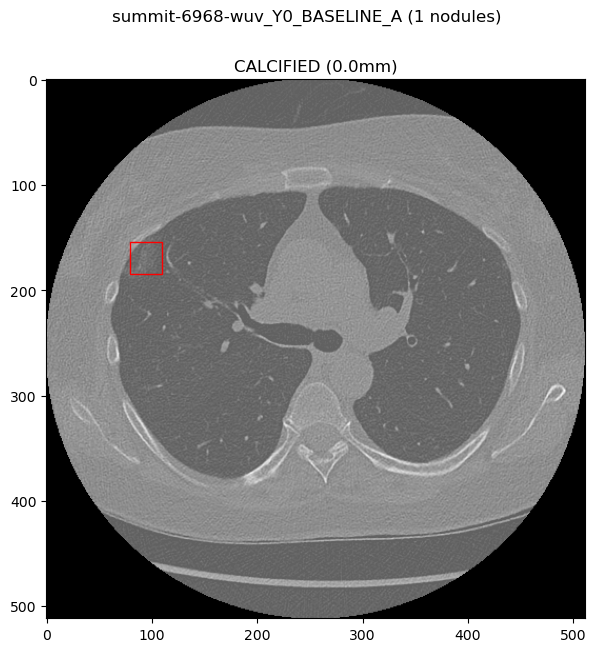

summit-6977-qgr_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-6977-qgr/summit-6977-qgr_Y0_BASELINE_A.mhd


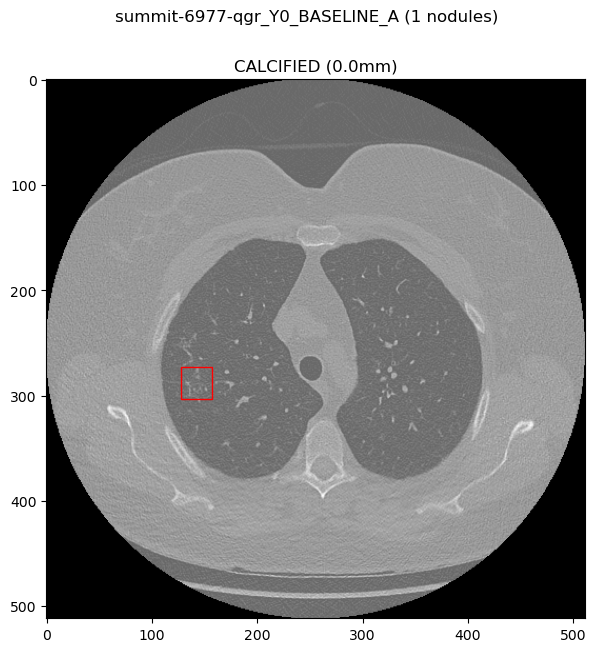

summit-7335-rsa_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-7335-rsa/summit-7335-rsa_Y0_BASELINE_A.mhd


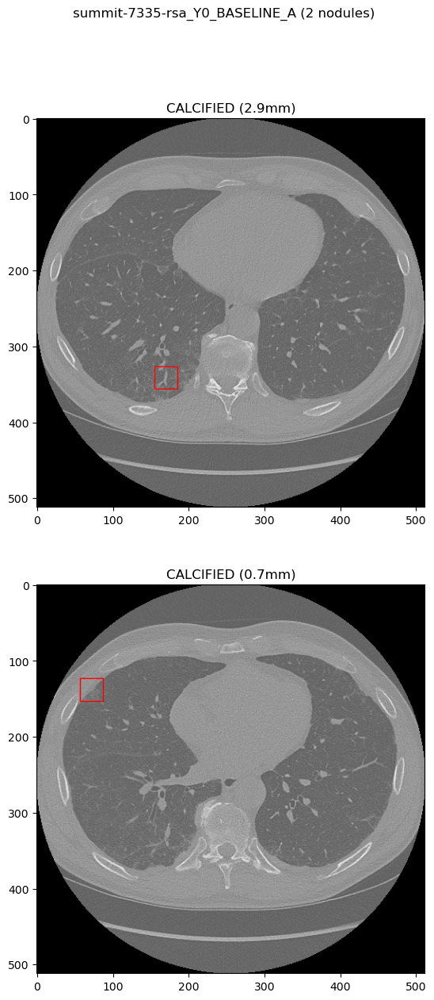

summit-7424-svu_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-7424-svu/summit-7424-svu_Y0_BASELINE_A.mhd


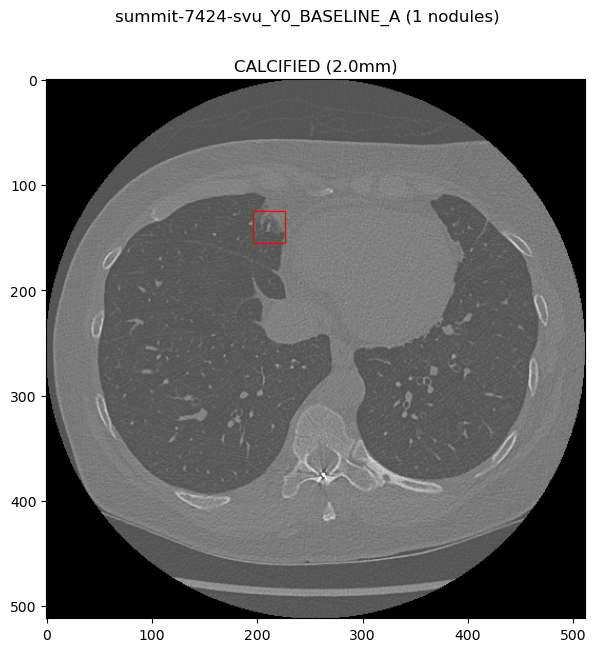

summit-7935-trn_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-7935-trn/summit-7935-trn_Y0_BASELINE_A.mhd


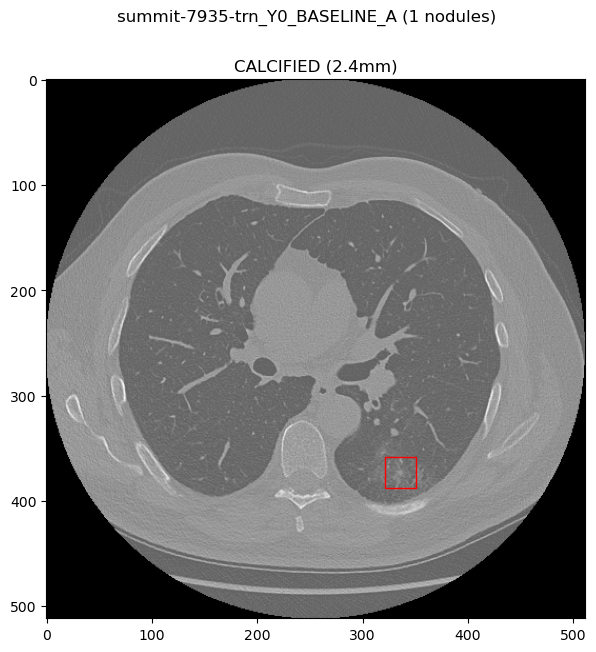

summit-9284-fgt_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-9284-fgt/summit-9284-fgt_Y0_BASELINE_A.mhd


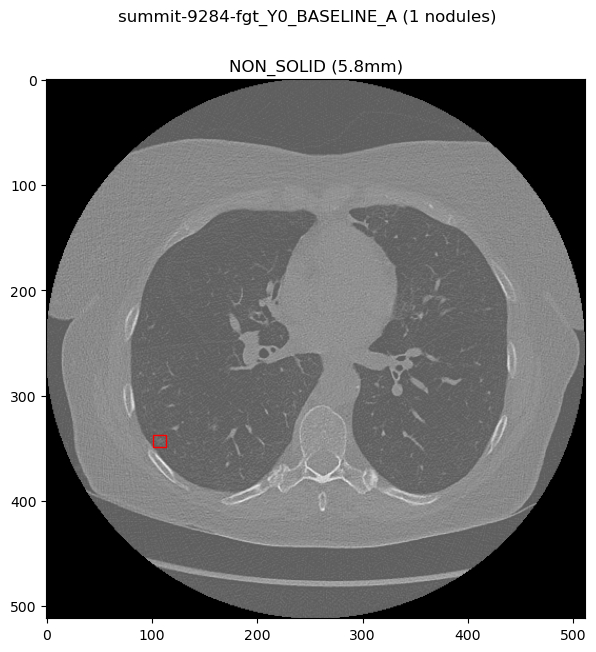

summit-9387-dqn_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-9387-dqn/summit-9387-dqn_Y0_BASELINE_A.mhd


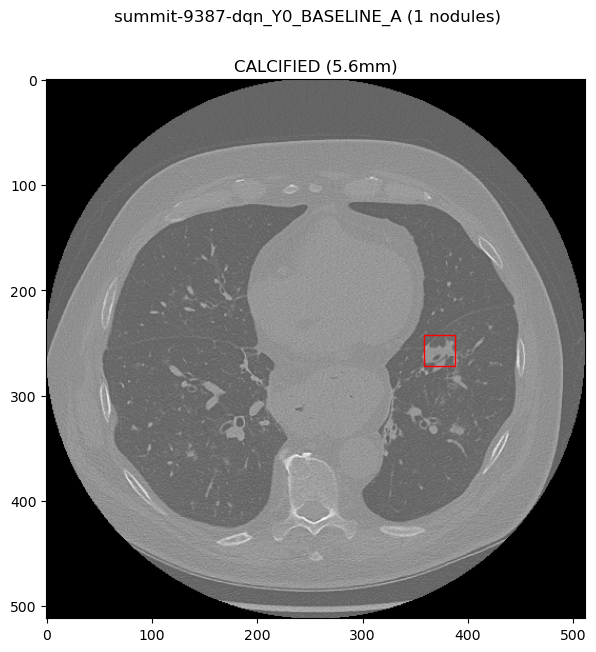

summit-9966-sgp_Y0_BASELINE_A already exists
/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-9966-sgp/summit-9966-sgp_Y0_BASELINE_A.mhd


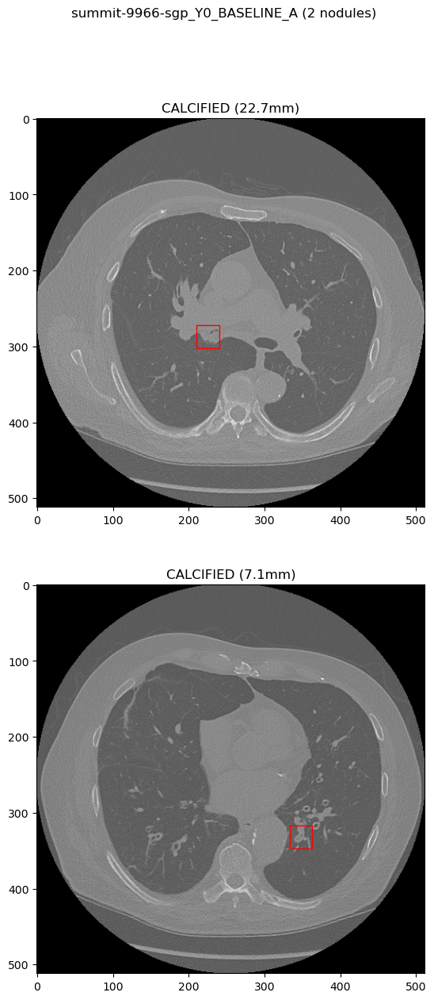

In [45]:

for scan_id, grp in all_data.groupby('scan_id'):
    display_nodules(scan_id, grp)

In [37]:
import zipfile
import nibabel as nib
import numpy as np
import tempfile

def copy_segmentation_from_cluster(scan_id):
    study_id = scan_id.split('_')[0]
    # now copy the src file
    if not os.path.exists(f"{workspace_path}/data/summit/segmentations/{study_id}"):
        os.makedirs(f"{workspace_path}/data/summit/segmentations/{study_id}", exist_ok=True)

        command = [
            "scp",
            "-P 2222",
            f"jmccabe@localhost:/SAN/medic/SummitSegmentations/Segmentations/TotalSegmentator/V2/{scan_id}.zip",
            f"{workspace_path}/data/summit/segmentations/{study_id}/."
        ]
        result = subprocess.run(command)
        print(result.stdout)
    else:
        print(f'{scan_id} already exists')

    return f"{workspace_path}/data/summit/segmentations/{study_id}/{scan_id}.zip"

def build_lung_masks(segmentation_path):

    with tempfile.TemporaryDirectory() as temp_dir:
        with zipfile.ZipFile(segmentation_path, 'r') as zip_ref:
            zip_ref.extract('lung_lower_lobe_left.nii.gz', temp_dir)
            zip_ref.extract('lung_lower_lobe_right.nii.gz', temp_dir)
            zip_ref.extract('lung_upper_lobe_left.nii.gz', temp_dir)
            zip_ref.extract('lung_upper_lobe_right.nii.gz', temp_dir)
            zip_ref.extract('lung_middle_lobe_right.nii.gz', temp_dir)

        for idx, nii_path in enumerate(os.listdir(temp_dir)):
            mask = nib.load(os.path.join(temp_dir, nii_path))
            if idx == 0:
                combined_mask = mask.get_fdata().astype(np.uint8)
            else:
                combined_mask += mask.get_fdata().astype(np.uint8)
        
        combined_mask_nifti = nib.Nifti1Image(combined_mask, mask.affine)
        nib.save(combined_mask_nifti, segmentation_path.replace('.zip', '.nii.gz'))
        os.remove(segmentation_path)

for scan_id, grp in all_data.groupby('scan_id'):
    segmentation_path = copy_segmentation_from_cluster(scan_id)
    build_lung_masks(segmentation_path)

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


Distance Transform Shape: (512, 512)
Distance from the point (106, 176) to the lung mask: -3.0 mm


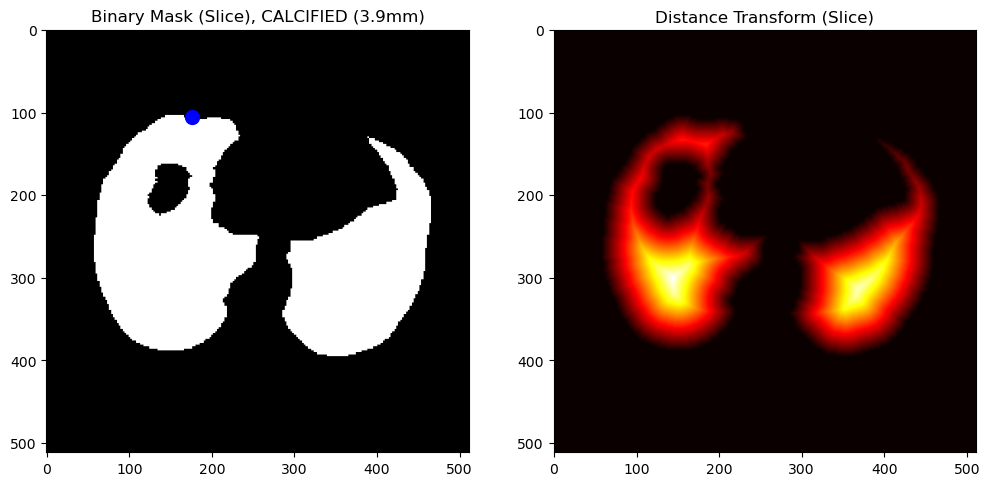

Distance Transform Shape: (512, 512)
Distance from the point (330, 144) to the lung mask: 35.17101079013795 mm


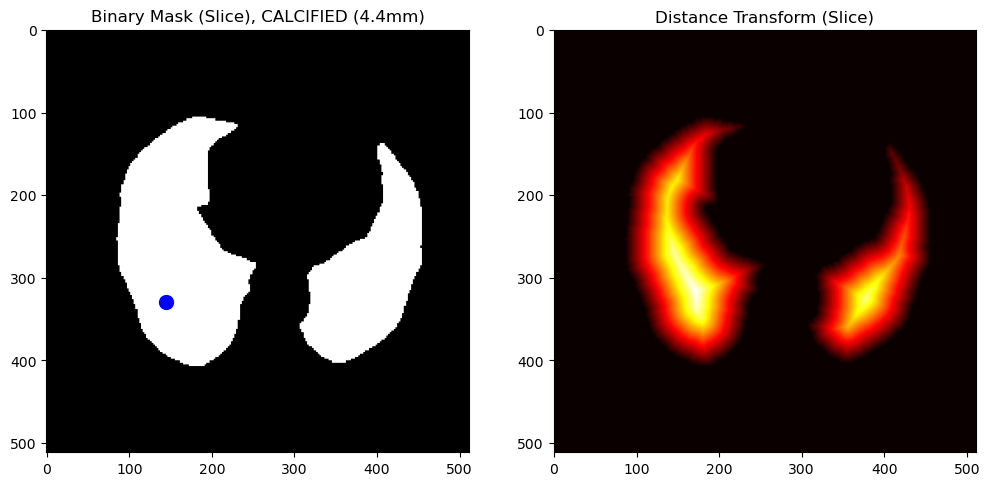

Distance Transform Shape: (512, 512)
Distance from the point (179, 45) to the lung mask: 1.0 mm


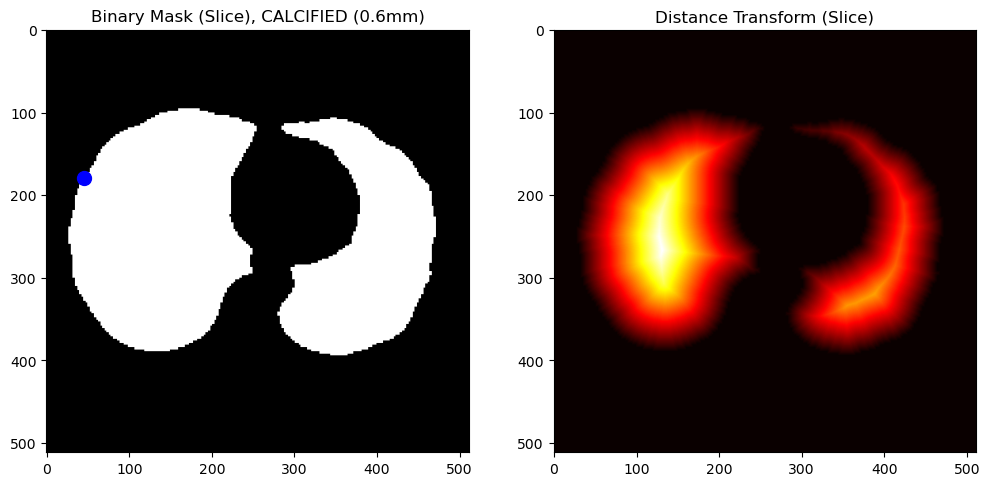

Distance Transform Shape: (512, 512)
Distance from the point (207, 99) to the lung mask: 21.93171219946131 mm


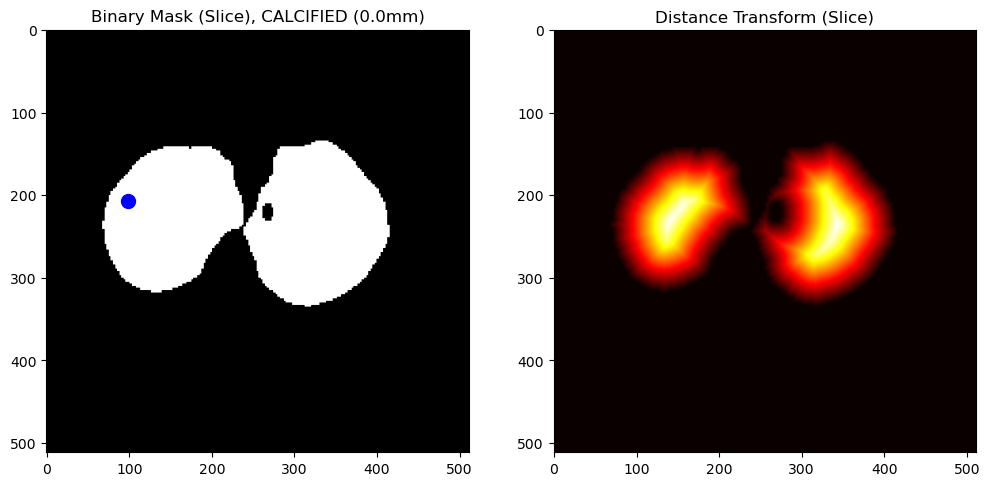

Distance Transform Shape: (512, 512)
Distance from the point (285, 322) to the lung mask: -3.0 mm


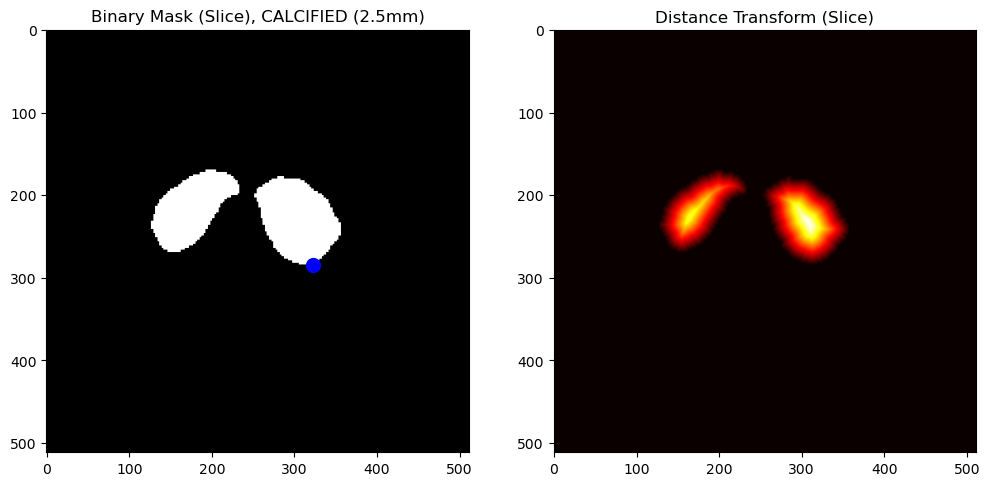

Distance Transform Shape: (512, 512)
Distance from the point (160, 115) to the lung mask: -1.0 mm


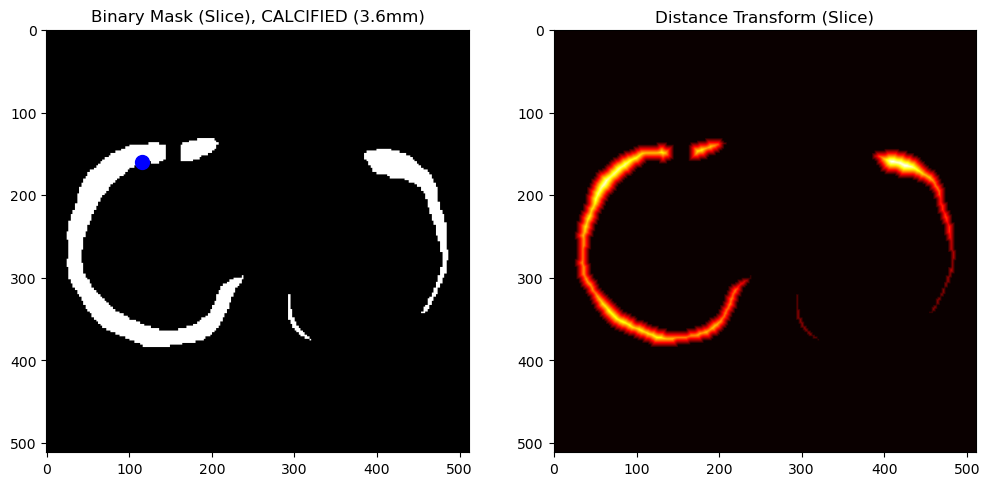

Distance Transform Shape: (512, 512)
Distance from the point (278, 58) to the lung mask: -1.0 mm


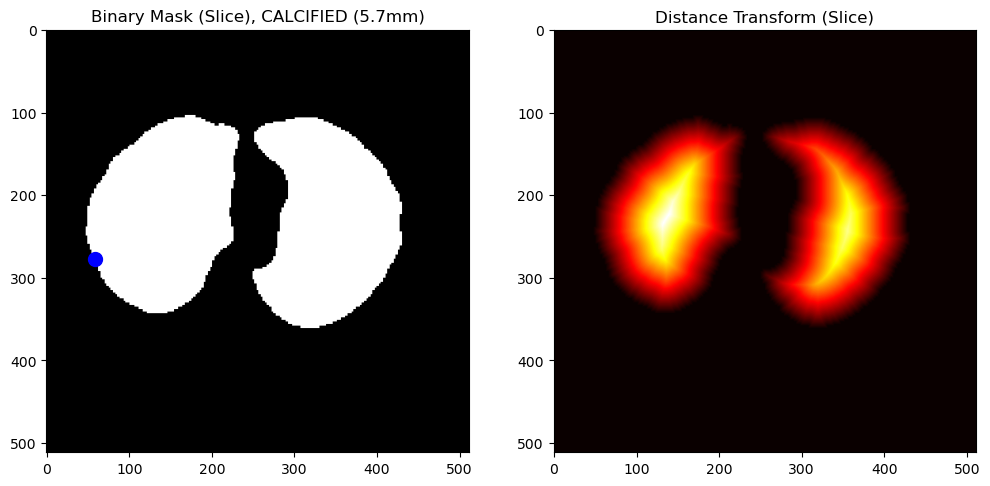

Distance Transform Shape: (512, 512)
Distance from the point (265, 109) to the lung mask: 24.20743687382041 mm


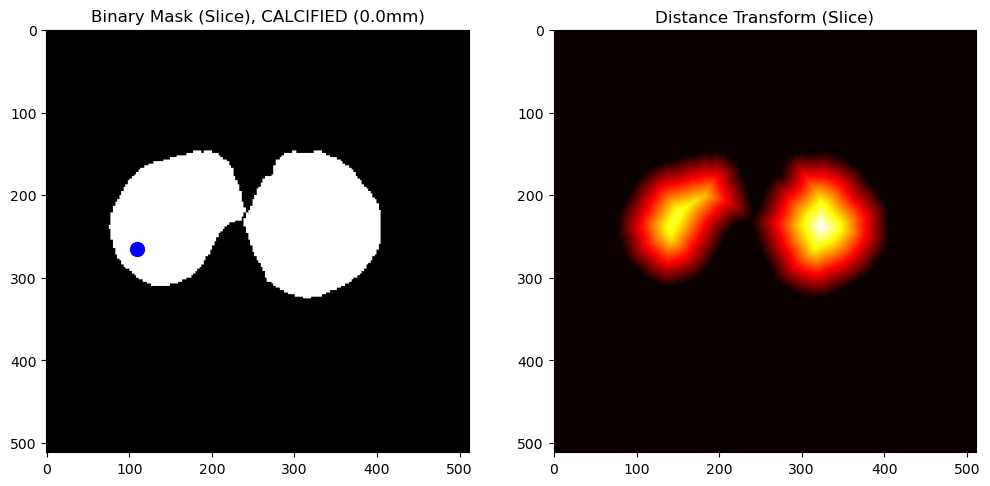

Distance Transform Shape: (512, 512)
Distance from the point (229, 130) to the lung mask: 57.0 mm


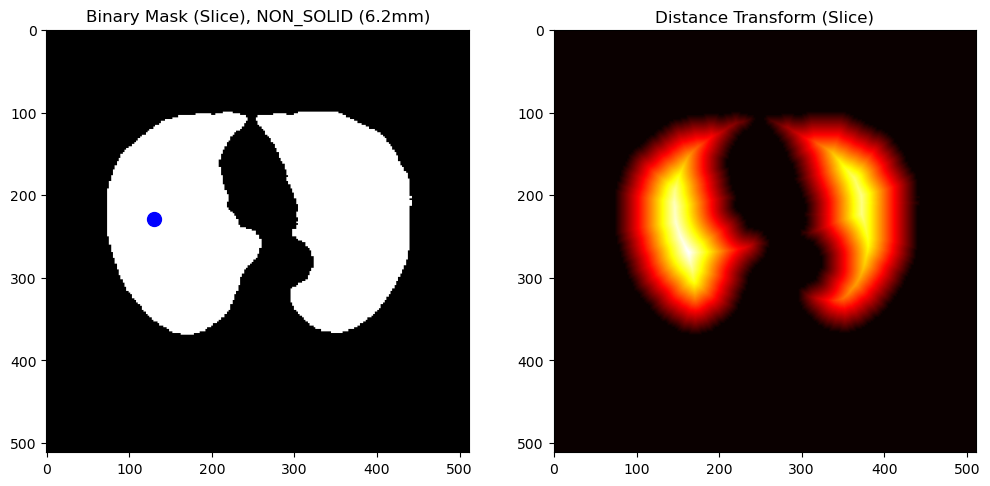

Distance Transform Shape: (512, 512)
Distance from the point (237, 161) to the lung mask: 33.37663853655727 mm


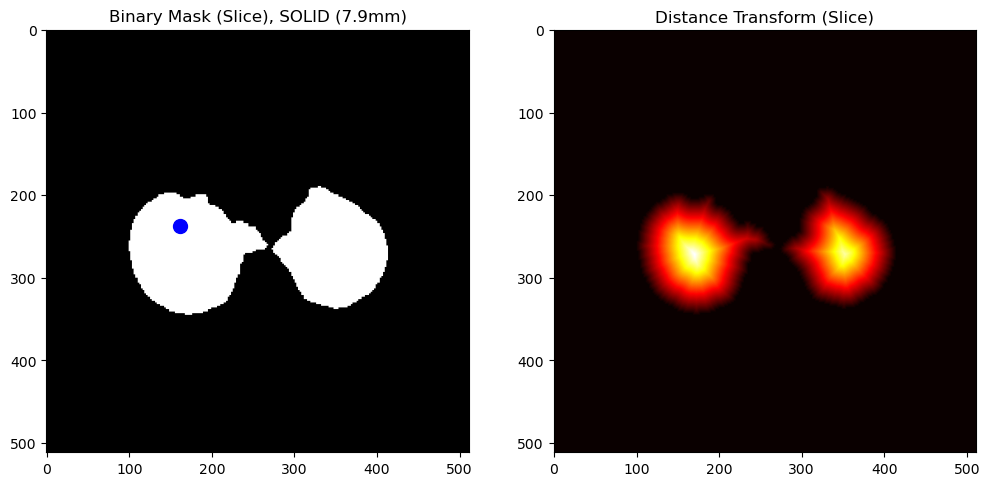

Distance Transform Shape: (512, 512)
Distance from the point (247, 122) to the lung mask: 76.94153624668537 mm


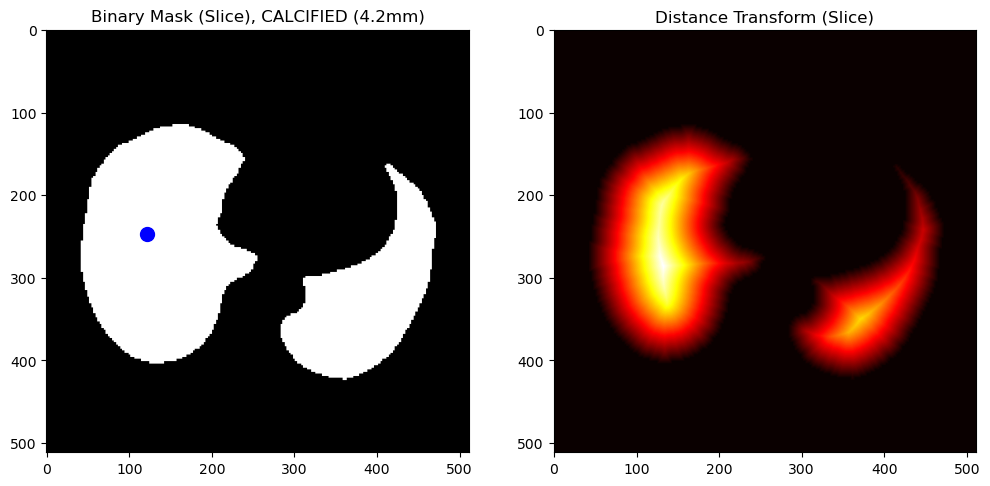

Distance Transform Shape: (512, 512)
Distance from the point (257, 88) to the lung mask: 44.553338819890925 mm


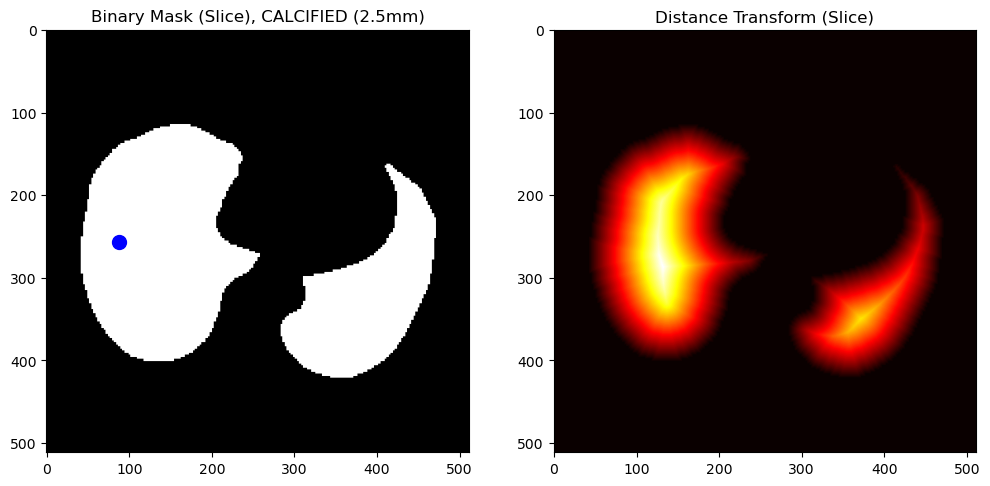

Distance Transform Shape: (512, 512)
Distance from the point (348, 117) to the lung mask: 23.323807579381203 mm


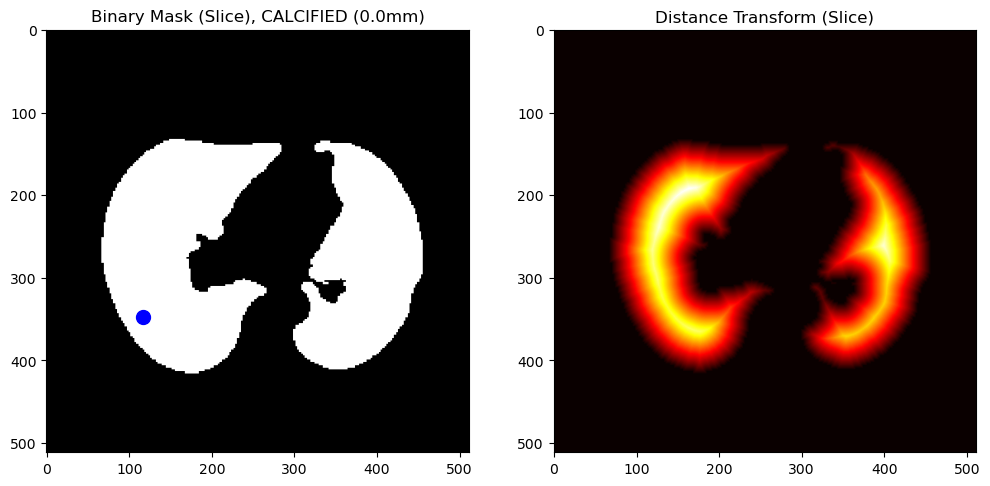

Distance Transform Shape: (512, 512)
Distance from the point (322, 144) to the lung mask: 32.202484376209235 mm


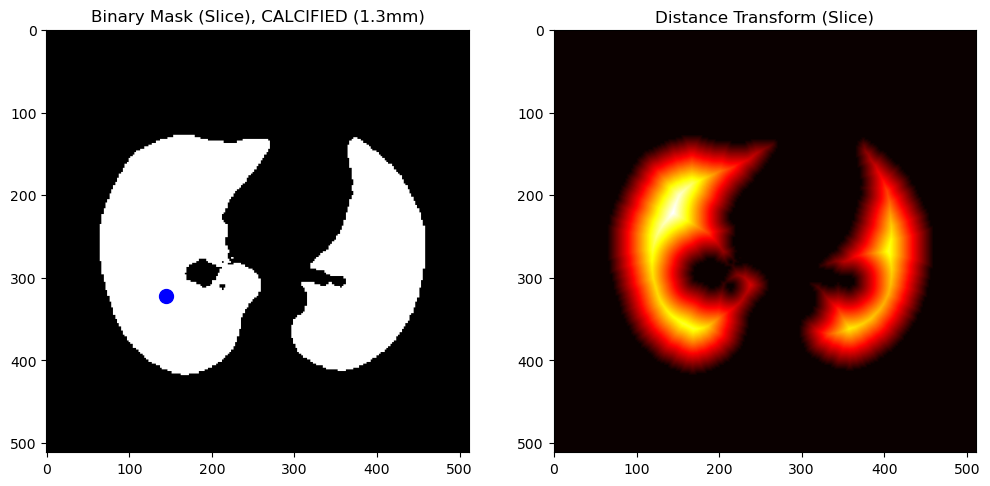

Distance Transform Shape: (512, 512)
Distance from the point (341, 170) to the lung mask: 26.92582403567252 mm


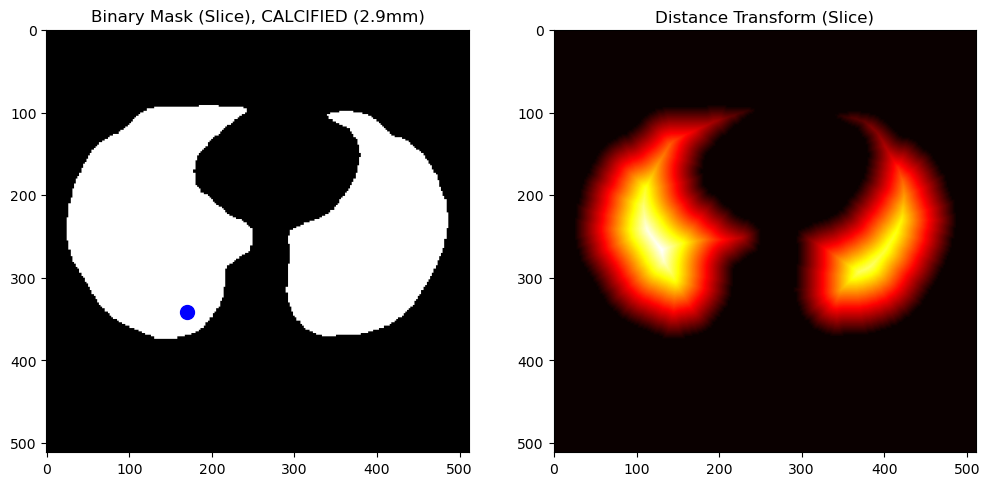

Distance Transform Shape: (512, 512)
Distance from the point (138, 72) to the lung mask: -2.23606797749979 mm


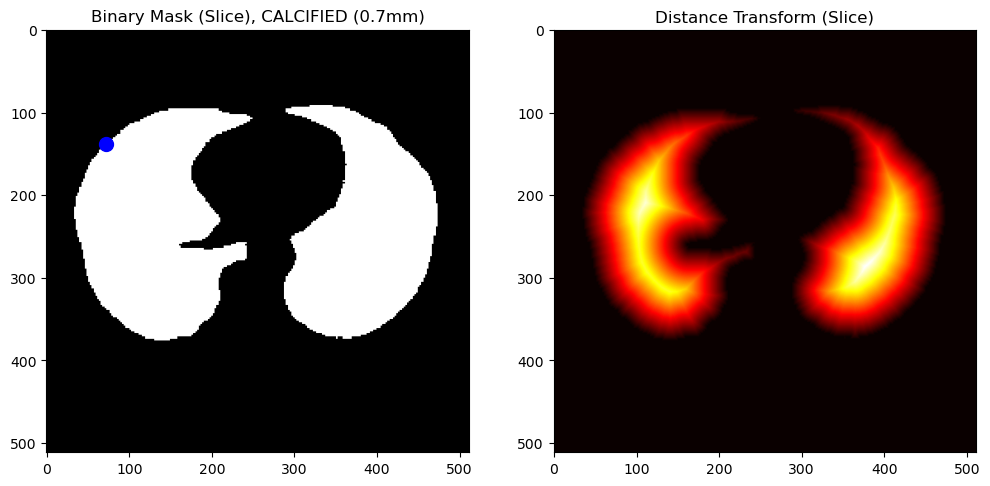

Distance Transform Shape: (512, 512)
Distance from the point (343, 107) to the lung mask: 7.211102550927978 mm


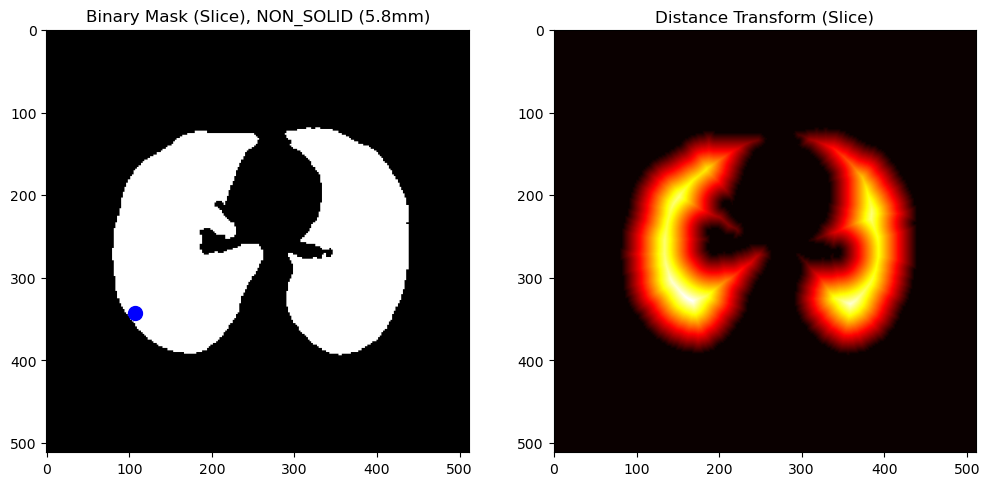

Distance Transform Shape: (512, 512)
Distance from the point (373, 336) to the lung mask: 26.92582403567252 mm


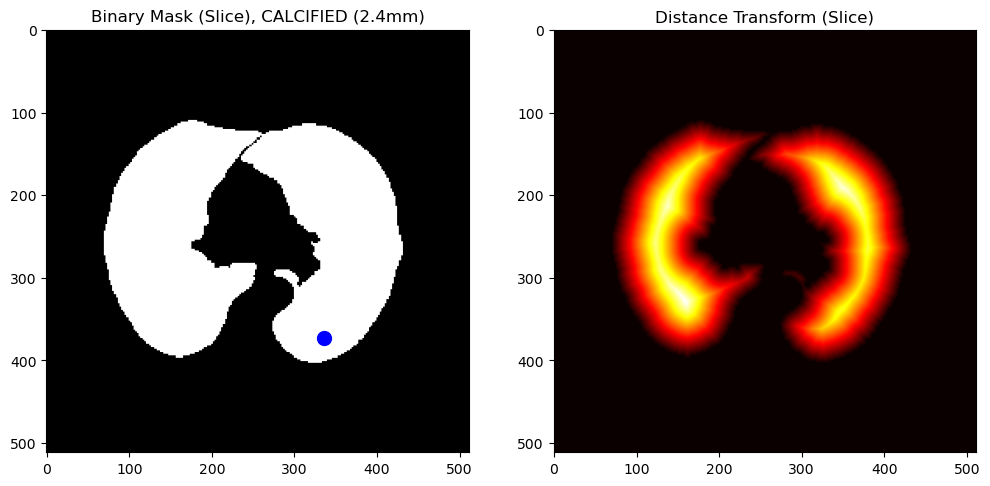

Distance Transform Shape: (512, 512)
Distance from the point (148, 121) to the lung mask: 12.36931687685298 mm


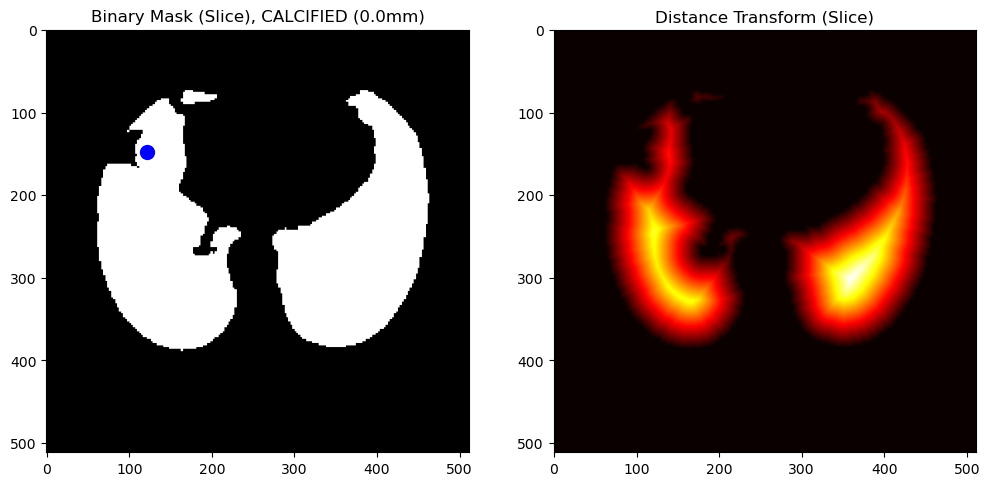

Distance Transform Shape: (512, 512)
Distance from the point (222, 63) to the lung mask: -1.0 mm


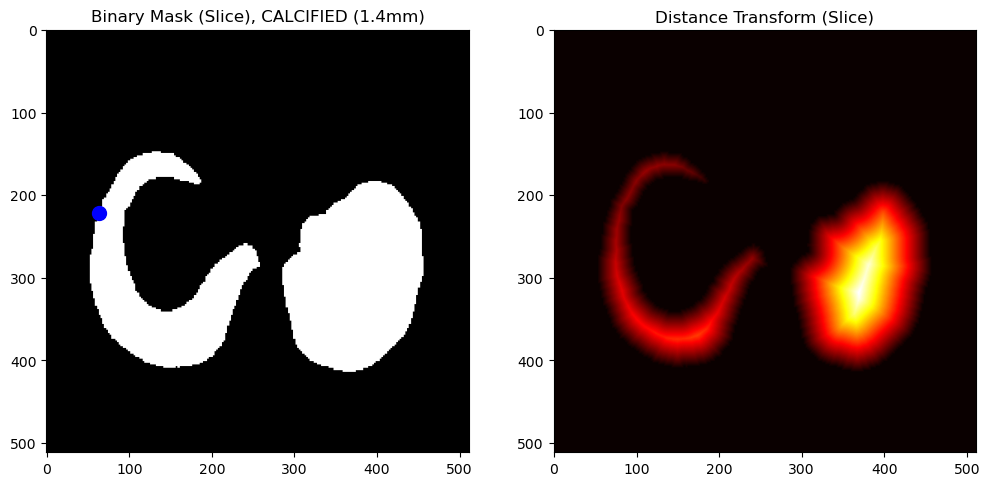

Distance Transform Shape: (512, 512)
Distance from the point (157, 333) to the lung mask: 30.265491900843113 mm


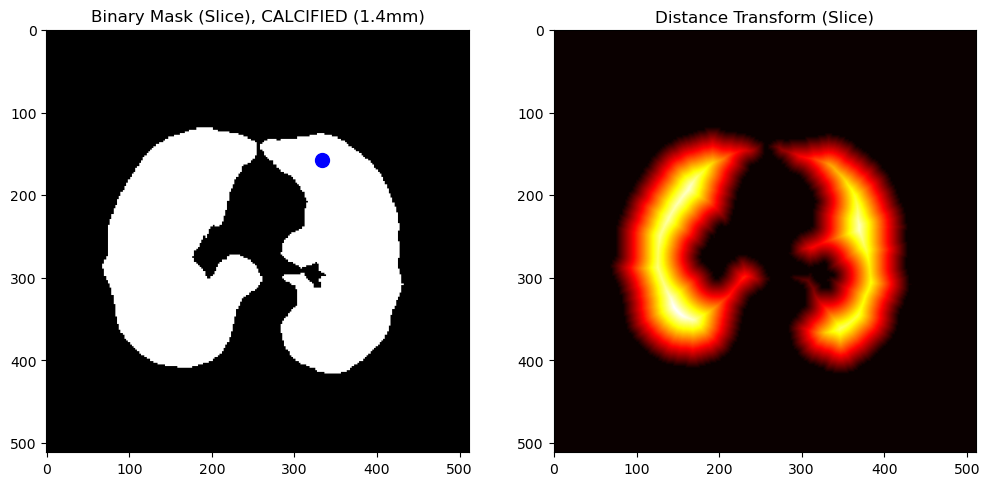

Distance Transform Shape: (512, 512)
Distance from the point (169, 94) to the lung mask: 13.038404810405298 mm


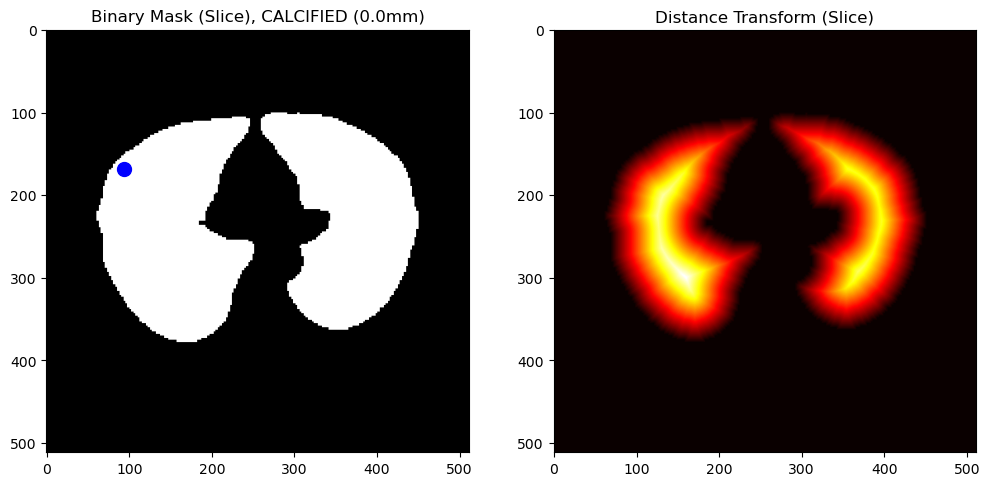

Distance Transform Shape: (512, 512)
Distance from the point (288, 142) to the lung mask: 31.953090617340916 mm


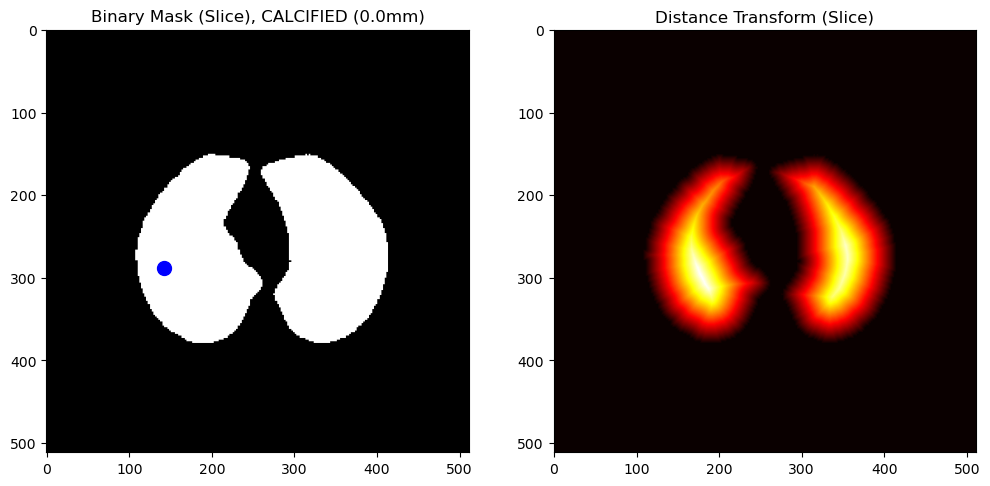

Distance Transform Shape: (512, 512)
Distance from the point (287, 225) to the lung mask: -6.0 mm


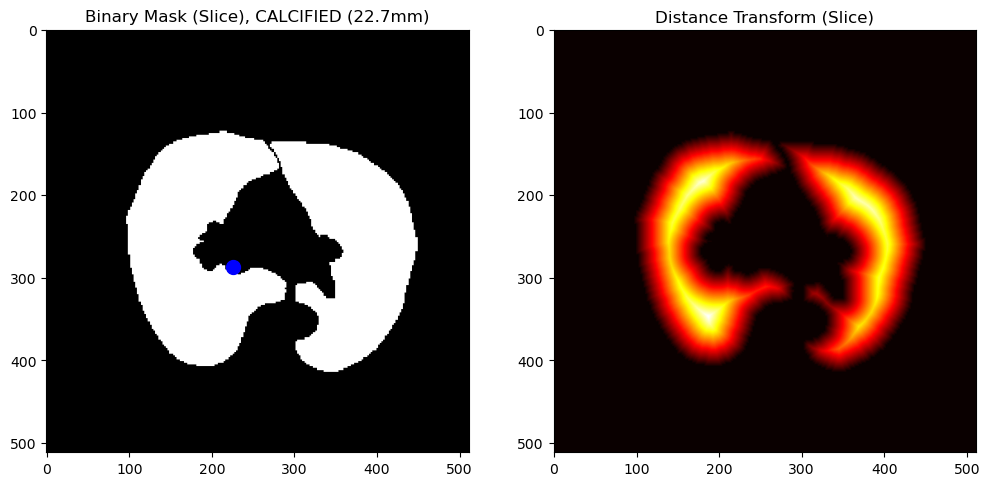

Distance Transform Shape: (512, 512)
Distance from the point (332, 348) to the lung mask: 19.0 mm


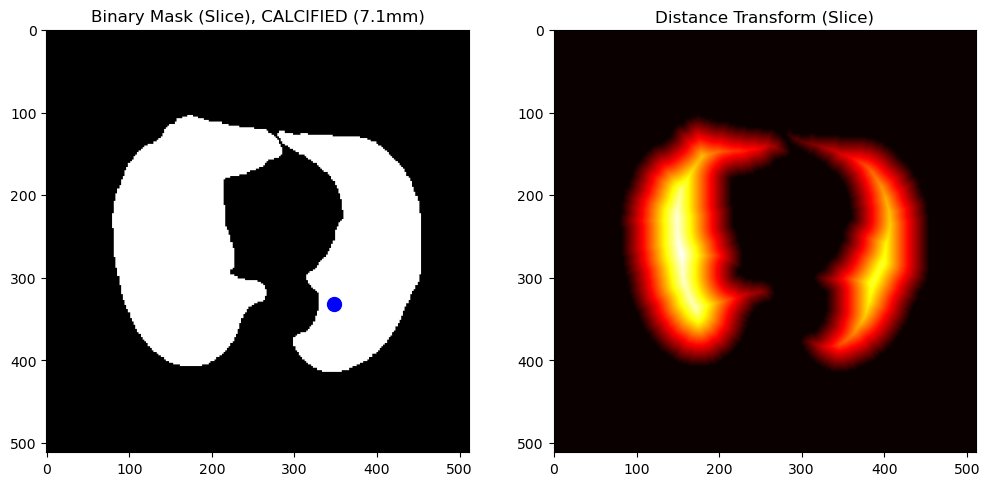

Distance Transform Shape: (512, 512)
Distance from the point (257, 373) to the lung mask: 29.206163733020468 mm


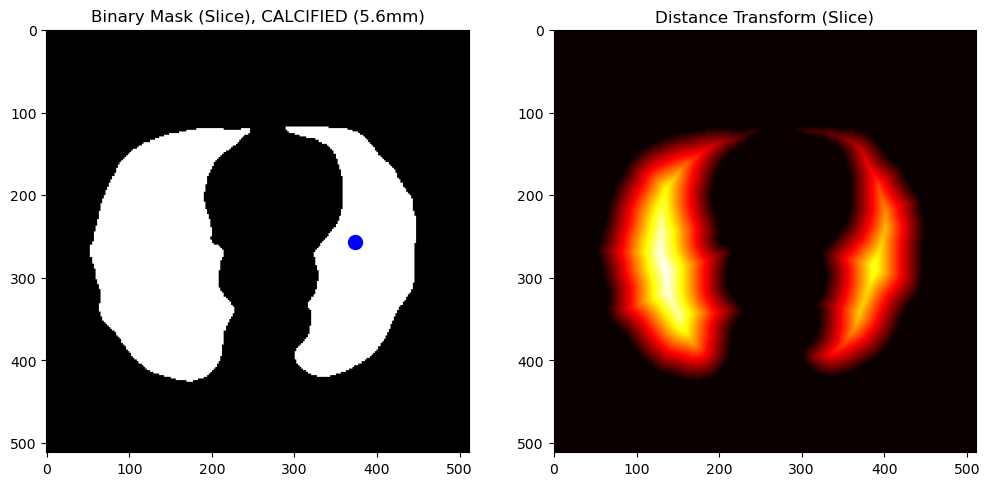

Distance Transform Shape: (512, 512)
Distance from the point (349, 163) to the lung mask: 18.110770276274835 mm


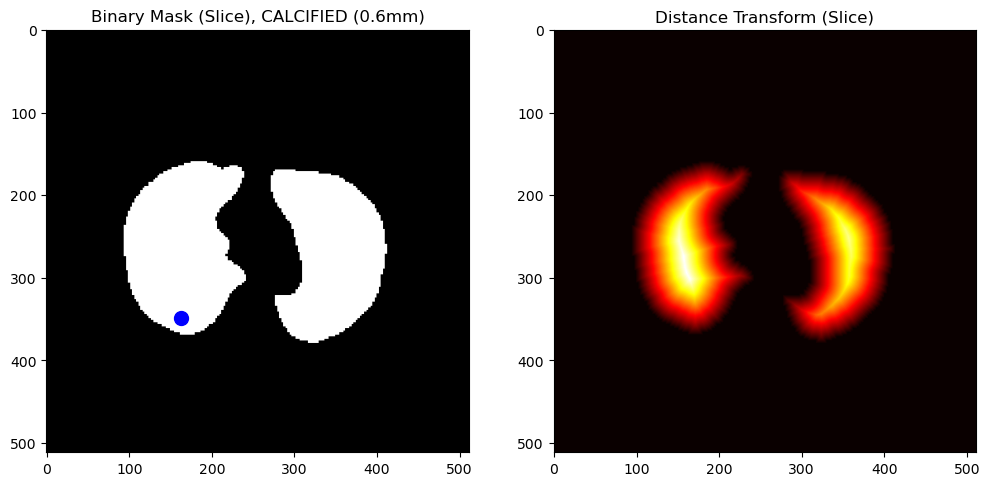

Distance Transform Shape: (512, 512)
Distance from the point (140, 211) to the lung mask: 9.433981132056603 mm


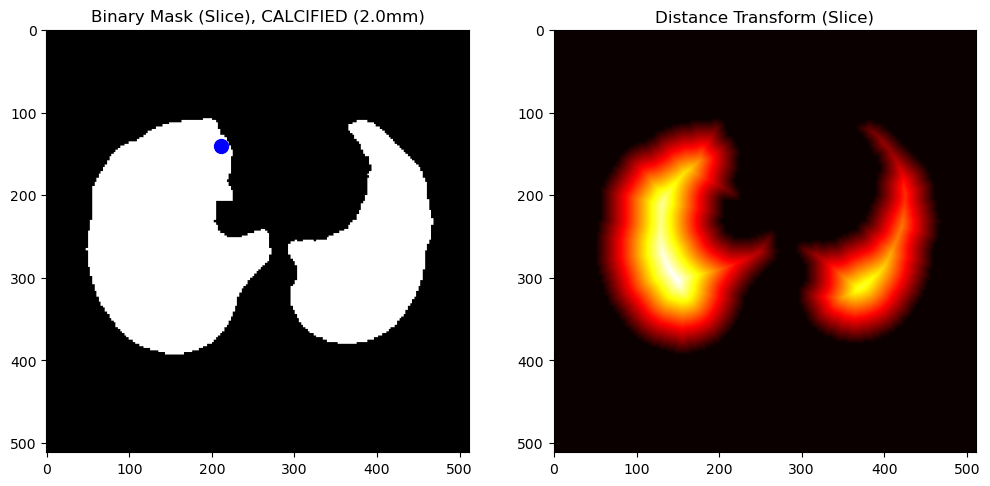

{0: -3.0,
 1: 35.17101079013795,
 2: 1.0,
 3: 21.93171219946131,
 4: -3.0,
 5: -1.0,
 6: -1.0,
 7: 24.20743687382041,
 8: 57.0,
 9: 33.37663853655727,
 10: 76.94153624668537,
 11: 44.553338819890925,
 12: 23.323807579381203,
 13: 32.202484376209235,
 14: 26.92582403567252,
 15: -2.23606797749979,
 16: 7.211102550927978,
 17: 26.92582403567252,
 18: 12.36931687685298,
 19: -1.0,
 20: 30.265491900843113,
 21: 13.038404810405298,
 22: 31.953090617340916,
 23: -6.0,
 24: 19.0,
 25: 29.206163733020468,
 26: 18.110770276274835,
 27: 9.433981132056603}

In [90]:

from scipy.ndimage import distance_transform_edt

def calculate_distance_from_mask(scan_id, idx, row, col, nodule_type, nodule_diameter):

    mask_path = f"{workspace_path}/data/summit/segmentations/{scan_id.split('_')[0]}/{scan_id}.nii.gz"
    mask = nib.load(mask_path).get_fdata().astype(np.uint8)
    mask = np.transpose(mask, (2, 1, 0))
    mask = mask[idx, :, :]

    distance_transform = distance_transform_edt(mask)

    print(f"Distance Transform Shape: {distance_transform.shape}")

    # Define the point (in voxel coordinates)
    point = (col, row)  # Example point outside the lung region
    if mask[point] == 0:
        xdistance_transform = distance_transform_edt(1 - mask)
        distance_to_lung = xdistance_transform[point] * -1
    else:
        distance_to_lung = distance_transform[point]

    # Get the distance from the point to the nearest lung voxel
    print(f"Distance from the point {point} to the lung mask: {distance_to_lung} mm")    

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.title(f"Binary Mask (Slice), {nodule_type} ({nodule_diameter}mm)")
    plt.imshow(mask[:, :], cmap='gray')
    plt.scatter(row, col, color='blue', label='Nodule Center', s=100)

    plt.subplot(1, 2, 2)
    plt.title("Distance Transform (Slice)")
    plt.imshow(distance_transform[:, :], cmap='hot')

    plt.show()

    return distance_to_lung


distances_to_lung = {}
for idx, row in all_data.iterrows():
    distances_to_lung[idx] =  calculate_distance_from_mask(
        row['scan_id'], 
        row['idx'], 
        row['col'], 
        row['row'], 
        row['nodule_type'], 
        row['nodule_diameter_mm']
    )


distances_to_lung

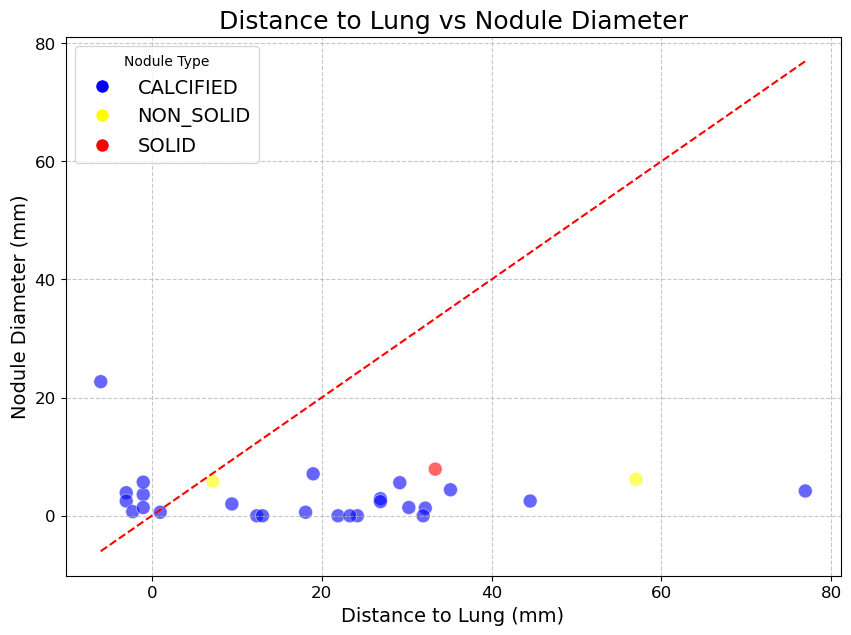

In [121]:
# all_data = all_data.join(pd.Series(distances_to_lung, name='distance_to_lung'))
all_data.head()
plt.figure(figsize=(10, 7))

nodule_colors = {
    'CALCIFIED': 'blue',
    'NON_SOLID': 'yellow',
    'SOLID': 'red'
}

scatter = plt.scatter(
    all_data['distance_to_lung'], 
    all_data['nodule_diameter_mm'], 
    c=all_data['nodule_type'].map(nodule_colors),
    alpha=0.6,
    edgecolors='w',
    linewidth=0.5,
    s=100
)

plt.plot([
    all_data['distance_to_lung'].min(), 
    all_data['distance_to_lung'].max()], 
    [all_data['distance_to_lung'].min(), 
     all_data['distance_to_lung'].max()
], 'r--')

handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) 
    for color in nodule_colors.values()
]

labels = list(nodule_colors.keys())

plt.legend(handles, labels, title="Nodule Type", fontsize=14)

plt.xlabel('Distance to Lung (mm)', fontsize=14)
plt.ylabel('Nodule Diameter (mm)', fontsize=14)
plt.title('Distance to Lung vs Nodule Diameter', fontsize=18)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()